### Import Libraries

In [2]:
from itertools import groupby
import numpy as np
from tqdm.notebook import tqdm
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
import wandb
from PIL import Image
import tifffile
import gc
import itertools
import yaml
import json

os.environ["CUDA_VISIBLE_DEVICES"] = "1"

# from glob import glob
import matplotlib.pyplot as plt

In [3]:
# !pip install segmentation-models-pytorch
# !pip install cmaes
# !pip install supervision
# !pip install shapely==2.0.4
# !pip install ttach
# !pip install vision-transformer-pytorch
# !pip install pytorch_metric_learning

In [4]:
#  !git clone https://github.com/Solafune-Inc/FieldAreaSegmentation.git

In [5]:
import yaml
import timm 
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
from torch.nn.modules.loss import _Loss
import segmentation_models_pytorch as smp
from segmentation_models_pytorch.base.initialization import initialize_decoder
from segmentation_models_pytorch.base import modules as md

# Lightning module
import torch
import pytorch_lightning as pl
from pytorch_lightning.loggers import WandbLogger
from torch.optim.lr_scheduler import CosineAnnealingLR, ReduceLROnPlateau
from torch.optim import AdamW, Adam
import torch.nn as nn
from torchmetrics.functional import dice
from torchmetrics.classification import F1Score
from torchmetrics.classification import JaccardIndex
from torchmetrics.functional.classification import binary_accuracy, binary_f1_score
from sklearn.metrics import roc_auc_score, f1_score

from timm.optim.optim_factory import create_optimizer
from types import SimpleNamespace

import wandb

### CFG

In [6]:
class CFG:
    debug = False
    classes = 1
    select_fold = 0 # 3fold分(0, 1, 2)実行してください
    data_root = os.path.join(os.getcwd(), "preprocessed_data/") # field-area-segmentation-semantic-dataset-v8.ipynbの出力を指定してください
    stride = 128
    batch_size = 3
    threshold = 0.5
    mask_types = ["mask", "mask_bound"]
    diff_threshold = 0.7

    # ------------------
    if debug:
        max_epochs = 1
        min_epochs = 1
    else:
        max_epochs = 45 # 250
        min_epochs = 20 # 20
    
    # ------------------
    with open(f'{data_root}/cfg.yaml', 'r') as yml:
        config = yaml.safe_load(yml)
    train_statistics = pd.read_csv(f"{data_root}/calc_static/train_statistics.csv")
    if (config["image_suffix"] == "tif") & (config['use_channel'] != "all"):
        mean = list(train_statistics["mean"].iloc[config["use_channel"]])
        std = list(train_statistics["std"].iloc[config["use_channel"]])
    else:
        mean = list(train_statistics["mean"])
        std = list(train_statistics["std"])
    in_chans = len(mean)
    
    # ------------------
    meta = pd.read_csv(f"{data_root}/ann_meta.csv")
    meta["segmentations"] = meta["segmentations"].apply(eval)
    meta["file_name"] = "images/" + meta["file_name"].str.replace(".tif", ".npz")
    train_files = meta[meta["fold"] != select_fold]["file_name"].values
    valid_files = meta[meta["fold"] == select_fold]["file_name"].values
    valid_segmentation = meta[meta["fold"] == select_fold]["segmentations"].values
    
    test_files = np.array(["test/" + _ for _ in os.listdir(f"{data_root}/test")])

### Model

In [7]:
import math
from torch.nn.modules.utils import _pair, _quadruple


class MedianPool2d(nn.Module):
    """ Median pool (usable as median filter when stride=1) module.
    
    Args:
         kernel_size: size of pooling kernel, int or 2-tuple
         stride: pool stride, int or 2-tuple
         padding: pool padding, int or 4-tuple (l, r, t, b) as in pytorch F.pad
         same: override padding and enforce same padding, boolean
    """
    def __init__(self, kernel_size=3, stride=1, padding=0, same=False):
        super(MedianPool2d, self).__init__()
        self.k = _pair(kernel_size)
        self.stride = _pair(stride)
        self.padding = _quadruple(padding)  # convert to l, r, t, b
        self.same = same
        torch.use_deterministic_algorithms(mode=True, warn_only=True)

    def _padding(self, x):
        if self.same:
            ih, iw = x.size()[2:]
            if ih % self.stride[0] == 0:
                ph = max(self.k[0] - self.stride[0], 0)
            else:
                ph = max(self.k[0] - (ih % self.stride[0]), 0)
            if iw % self.stride[1] == 0:
                pw = max(self.k[1] - self.stride[1], 0)
            else:
                pw = max(self.k[1] - (iw % self.stride[1]), 0)
            pl = pw // 2
            pr = pw - pl
            pt = ph // 2
            pb = ph - pt
            padding = (pl, pr, pt, pb)
        else:
            padding = self.padding
        return padding
    
    def forward(self, x):
        # using existing pytorch functions and tensor ops so that we get autograd, 
        # would likely be more efficient to implement from scratch at C/Cuda level
        x = F.pad(x, self._padding(x), mode='reflect')
        x = x.unfold(2, self.k[0], self.stride[0]).unfold(3, self.k[1], self.stride[1])
        x = x.contiguous().view(x.size()[:4] + (-1,)).median(dim=-1)[0]
        return x


class Model(nn.Module):
    def __init__(self, cfg, pretrained=True, tta=None, mask_type=None):
        super().__init__()
        self.mask_type = mask_type
        name = cfg['model']['encoder']
        pretrained = 'imagenet' if (pretrained and cfg['model']['pretrained']) else None
        decoder_channels = cfg['model']['decoder_channels']  # (256, 128, 64, 32, 16)
        # self.median_pool = MedianPool2d(kernel_size=3, stride=1, padding=1, same=False)
        
        if cfg['model']['segmentation'] == "Unet":
            self.unet = smp.Unet(name,
                                 encoder_weights=pretrained,
                                 classes=cfg['model']['classes'],
                                 in_channels=cfg['model']['in_chans'],
                                 decoder_channels=decoder_channels
                                  )
        elif cfg['model']['segmentation'] == "UnetPlusPlus":
            self.unet = smp.UnetPlusPlus(name,
                                 encoder_weights=pretrained,
                                 classes=cfg['model']['classes'],
                                 in_channels=cfg['model']['in_chans'],
                                 decoder_channels=decoder_channels
                                  )
        elif cfg['model']['segmentation'] == "MAnet":
            self.unet = smp.MAnet(name,
                                 encoder_weights=pretrained,
                                 classes=cfg['model']['classes'],
                                 in_channels=cfg['model']['in_chans'],
                                 decoder_channels=decoder_channels
                                  )
        else:
            raise

    def unsharp_masking(self, imgs, k=0.7):

        kernel = torch.FloatTensor([
            [-k, -k, -k],
            [-k, 1+(8*k), -k],
            [-k, -k, -k]
        ])

        filter_ = kernel.expand(1, 1, 3, 3).to(torch.float32).to(device)  # [h,w] ⇒ [mb,c,h,w]
        output = F.conv2d(imgs, filter_, padding=1)

        return output
            
    def forward(self, x):
        
        y_pred = self.unet(x)

        return y_pred

In [8]:
cfgs = [

yaml.safe_load(f"""
model:
  segmentation: UnetPlusPlus
  encoder: tu-resnest26d # tu-ecaresnet26t
  pretrained: True
  classes: {CFG.classes}
  decoder_channels: [256, 128, 64, 32, 32]
  out_indices: None
  dropout: 0.0
  in_chans: {CFG.in_chans}
  height: 512
  width: 512
"""),
    
yaml.safe_load(f"""
model:
  segmentation: UnetPlusPlus
  encoder: tu-maxvit_small_tf_512
  pretrained: True
  classes: {CFG.classes}
  decoder_channels: [256, 128, 64, 32, 32]
  out_indices: None
  dropout: 0.0
  in_chans: {CFG.in_chans}
  height: 512
  width: 512
"""),
    
yaml.safe_load(f"""
model:
  segmentation: UnetPlusPlus
  encoder: tu-maxxvitv2_rmlp_base_rw_384
  pretrained: True
  classes: {CFG.classes}
  decoder_channels: [256, 128, 64, 32, 32]
  out_indices: None
  dropout: 0.0
  in_chans: {CFG.in_chans}
  height: 384
  width: 384
"""),

]

#### Check

In [9]:
os.makedirs(f'training_fold-{CFG.select_fold}/model_cfg', exist_ok=True)
for i, cfg in enumerate(cfgs):
    print(f'-- {i:02} --',cfg['model']['encoder'], '-'*10)
    with open(f'training_fold-{CFG.select_fold}/model_cfg/cfg{i:02}.yaml','w') as f:
        yaml.dump(cfg, f, default_flow_style=False, allow_unicode=True)

-- 00 -- tu-resnest26d ----------
-- 01 -- tu-maxvit_small_tf_512 ----------
-- 02 -- tu-maxxvitv2_rmlp_base_rw_384 ----------


In [10]:
if CFG.debug:
    
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    sample_idx = 0
    
    for i, cfg in enumerate(cfgs):
        print(f'-- {i:02} --',cfg['model']['encoder'], '-'*10)

        model = Model(cfg=cfg, mask_type="mask_bound").to(device)
        model.eval()

        in_chans = cfg['model']['in_chans']
        m = model.unet.encoder

        x = torch.randn(2, cfg['model']['in_chans'], cfg['model']['height'], cfg['model']['width'])
        x = x.to(device)
        print('x:', x.shape)
        oo = m(x)
        for i, o in enumerate(oo):
             print(f'{i}:', o.shape)

        logit = model.forward(x)
        print('\nforward:', logit.shape, '\n')
        
    loss_module_dice = smp.losses.DiceLoss(mode="binary")
    loss_module_bce = smp.losses.SoftBCEWithLogitsLoss(pos_weight=torch.FloatTensor([1.0]), reduction=None)
    loss_module_focal1 = smp.losses.FocalLoss(mode='binary', gamma=4.0, reduction=None) # , alpha=0.0
    loss_module_focal2 = smp.losses.FocalLoss(mode='binary', gamma=4.0) # , alpha=0.0

    p1 = torch.randn(2, 1, cfg['model']['height'], cfg['model']['width'])
    p1 = torch.where(p1 > 0.2, 1.0, 0.0)
    print(loss_module_focal1(p1, logit).view(-1, 1, cfg['model']['height'], cfg['model']['width']).shape)
    print(loss_module_focal2(p1, logit))

### Dataset

In [11]:
import torchvision.transforms as T
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.data import DataLoader
# from torchvision.transforms import v2
import ttach as tta

def cutmix(batch, alpha=0.5):
    
    imgs, labels = batch
    
    indices = torch.randperm(imgs.size(0))
    shuffled_imgs = imgs[indices]
    shuffled_labels = labels[indices]

    lam = np.random.beta(alpha, alpha)
    
    image_h, image_w = imgs.shape[-2], imgs.shape[-1]
    cx = np.random.uniform(0, image_w)
    cy = np.random.uniform(0, image_h)
    w = image_w * np.sqrt(1 - lam)
    h = image_h * np.sqrt(1 - lam)
    x0 = int(np.round(max(cx - w / 2, 0)))
    x1 = int(np.round(min(cx + w / 2, image_w)))
    y0 = int(np.round(max(cy - h / 2, 0)))
    y1 = int(np.round(min(cy + h / 2, image_h)))
    
    imgs[..., y0:y1, x0:x1] = shuffled_imgs[..., y0:y1, x0:x1]
    labels[..., y0:y1, x0:x1] = shuffled_labels[..., y0:y1, x0:x1]
        
    return imgs, labels

def mosaic(batch):
    
    imgs, labels = batch
    
    indices = torch.randperm(imgs.size(0))
    shuffled_imgs = imgs[indices]
    shuffled_labels = labels[indices]
    
    # images info
    size_x, size_y = imgs.size(-1), imgs.size(-2)
    center_x = size_x // 2
    center_y = size_y // 2
    diff_x = size_x // 4
    diff_y = size_y // 4

    # mosaic center x, y
    mosaic_center_x = int(np.random.uniform(center_x - diff_x, center_x + diff_x))
    mosaic_center_y = int(np.random.uniform(center_y - diff_y, center_y + diff_y))
    center_position = (mosaic_center_x, mosaic_center_y)
    
    boxes = []
    for loc in ['top_left', 'top_right', 'bottom_left', 'bottom_right']:
        if loc == 'top_left':
            x0 = 0
            x1 = center_position[0]
            y0 = 0
            y1 = center_position[1]
        elif loc == 'top_right':
            x0 = center_position[0]
            x1 = size_x
            y0 = 0
            y1 = center_position[1]
        elif loc == 'bottom_left':
            x0 = 0
            x1 = center_position[0]
            y0 = center_position[1]
            y1 = size_y
        else:
            x0 = center_position[0]
            x1 = size_x
            y0 = center_position[1]
            y1 = size_y
        boxes.append([x0, y0, x1, y1])
    
    break_c = int(np.random.uniform(1, 4))
    np.random.shuffle(boxes)
    for c, box in enumerate(boxes):
        x0, y0, x1, y1 = box
        imgs[..., y0:y1, x0:x1] = shuffled_imgs[..., y0:y1, x0:x1]
        labels[..., y0:y1, x0:x1] = shuffled_labels[..., y0:y1, x0:x1]
        if c == break_c:
            break
    
    return imgs, labels

class DataTransform():
    def __init__(self, height, width, image_div):  
        self.height = height
        self.width = width
        interpolation = cv2.INTER_CUBIC # cv2.INTER_LINEAR
        self.data_transform = {
            "train": A.Compose(
                [
                    A.RandomCrop(height=self.height // image_div, width=self.width // image_div, p=1),
                    A.Resize(height=self.height, width=self.width, interpolation=interpolation, p=1),
                    A.ShiftScaleRotate(p=0.5, shift_limit=0.0625, scale_limit=0.1, rotate_limit=15),
                    A.HorizontalFlip(p=0.5),
                    A.VerticalFlip(p=0.5),
                    A.Transpose(p=0.5),
                    A.RandomRotate90(p=0.5),
                    ToTensorV2(),
                ]
            ),
            "valid": A.Compose(
                [
                    # A.Resize(height=self.height, width=self.width, interpolation=interpolation, p=1),
                    ToTensorV2(),
                ]
            ),
            "test": A.Compose(
                [
                    # A.Resize(height=self.height, width=self.width, interpolation=interpolation, p=1),
                    ToTensorV2(),
                ]
            ),
        }


    def __call__(self, phase, img, anno_class_img):
        return self.data_transform[phase](image=img, mask=anno_class_img)

    
class FieldDataset(torch.utils.data.Dataset):
    def __init__(self, phase, files, transform, mask_type):
                
        self.phase = phase
        self.files = files
        self.transform = transform
        self.mask_type = mask_type
        self.normalize_image = T.Normalize(CFG.mean, CFG.std)
        self.normalize_size = len(CFG.mean)

    def __len__(self):
        return len(self.files)

    def __getitem__(self, index):
        
        npz = np.load(f'{CFG.data_root}/{self.files[index]}')
        imgs = npz["image"]
        labels = npz[self.mask_type]

        imgs = imgs.astype(np.float32)
        labels = labels.astype(np.float32)
        
        img_and_label = self.transform(self.phase, imgs, labels)
        img = img_and_label["image"]
        mask = img_and_label["mask"]
        
        img = self.normalize_image(img)
        
        return img, mask

In [12]:
# define dataset root and directory for images and annotations
device = 'cuda' if torch.cuda.is_available() else 'cpu'
num_workers = os.cpu_count()

if CFG.debug:
    
    cfg = cfgs[0]
    image_div = 1
    train_dataset = FieldDataset(phase="train", files=CFG.train_files, transform=DataTransform(cfg['model']['height'], cfg['model']['width'], image_div), mask_type=CFG.mask_types[0])
    val_dataset = FieldDataset(phase="valid", files=CFG.valid_files, transform=DataTransform(cfg['model']['height'], cfg['model']['width'], image_div), mask_type=CFG.mask_types[0])
    print(f"train_dataset: {len(train_dataset)}", f"val_dataset: {len(val_dataset)}")

    train_dataloader = DataLoader(train_dataset, batch_size=CFG.batch_size, shuffle=True, num_workers=num_workers, drop_last=True)
    val_dataloader = DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=num_workers)

    
    plt.figure(figsize=(8, 4))
    
    batch = next(iter(val_dataloader))
    img, labels = batch
    print('images:', img.shape)
    print('labels:', labels.shape)
    plt.subplot(1, 2, 1)
    plt.imshow(labels[0].detach().cpu().numpy())
    
    batch = next(iter(train_dataloader))
    img, labels = batch
    print('images:', img.shape)
    print('labels:', labels.shape)
    
    plt.subplot(1, 2, 2)
    plt.imshow(labels[0].detach().cpu().numpy())

### Training

In [13]:
config = yaml.safe_load(f"""
data_path: "/kaggle/input/contrails-images-ash-color"
output_dir: "training_fold-{CFG.select_fold}/models"

seed: 42
n_trials: 5 # 1000

train_bs: {CFG.batch_size}
valid_bs: {CFG.batch_size}
workers: {num_workers}

progress_bar_refresh_rate: 1

early_stop:
    monitor: "val_loss"
    mode: "min"
    patience: 10
    verbose: False
    min_delta: 0.0

trainer:
    max_epochs: {CFG.max_epochs}
    min_epochs: {CFG.min_epochs}
    enable_progress_bar: True

model:
    loss_module: "jaccard"
    loss_smooth: 0.01
    loss_gamma: 4.0
    optimizer_params:
        lr: 0.0001
        weight_decay: 0.01
        amsgrad: False
    scheduler:
        name: "ReduceLROnPlateau"
        params:
            CosineAnnealingLR:
                T_max: 2
                eta_min: 1.0e-6
                last_epoch: -1
            ReduceLROnPlateau:
                mode: "min"
                factor: 0.5
                patience: 4
                verbose: True
    slide:
        h_stride: {CFG.stride}
        w_stride: {CFG.stride}
        h_crop: 0
        w_crop: 0
        image_div: 1
    aug:
        cutmix: 1.0
        mosaic: 1.0
    tta: False
        
""")

with open(f'training_fold-{CFG.select_fold}/config.yaml','w') as f:
    yaml.dump(config, f, default_flow_style=False, allow_unicode=True)

In [14]:
def F1Score_instance(all_labels, all_preds, threshold=0.5, sample=False):
    f1s = F1Score(task='binary', multidim_average="samplewise", threshold=threshold).to(device)
    f1 = F1Score(task='binary', multidim_average="global", threshold=threshold).to(device)

    zeromask = torch.where(all_labels.view(all_labels.size()[0], -1).sum(dim=1) == 0)
    f1_score_global = f1(all_preds, all_labels.long())
    f1_score_sample = f1s(all_preds, all_labels.long())
    f1_score_sample_adj = f1_score_sample.clone()
    f1_score_sample_adj[zeromask] = torch.where(f1_score_sample_adj[zeromask] == 0, 1, f1_score_sample_adj[zeromask])
    
    if sample:
        return f1_score_global.item(), f1_score_sample_adj
    else:
        return f1_score_global.item(), f1_score_sample_adj.mean().item()

def JaccardScore_instance(all_labels, all_preds, threshold=0.5, sample=False):
    f1s = JaccardIndex(task='binary', average='micro', threshold=threshold).to(device)
    f1 = JaccardIndex(task='binary', average='macro', threshold=threshold).to(device)
    
    f1_score_global = f1(all_preds, all_labels.long())
    f1_score_sample = f1s(all_preds, all_labels.long())
    f1_score_sample_adj = f1_score_sample.clone()
    
    return f1_score_global.item(), f1_score_sample_adj.item()

class FocalTverskyLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(FocalTverskyLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1, alpha=0.7, beta=0.3, gamma=4/3):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = F.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        #True Positives, False Positives & False Negatives
        TP = (inputs * targets).sum()    
        FP = ((1-targets) * inputs).sum()
        FN = (targets * (1-inputs)).sum()
        
        Tversky = (TP + smooth) / (TP + alpha*FP + beta*FN + smooth)  
        FocalTversky = (1 - Tversky)**gamma
                       
        return FocalTversky
    
    
class LightningModule(pl.LightningModule):
    def __init__(self, model, config):
        super().__init__()
        self.config = config["model"]
        self.model = model
        self.loss_module_dice = smp.losses.DiceLoss(mode="binary", smooth=self.config["loss_smooth"])
        self.loss_module_bce = smp.losses.SoftBCEWithLogitsLoss(smooth_factor=self.config["loss_smooth"])
        self.loss_module_focal = smp.losses.FocalLoss(mode='binary', gamma=self.config["loss_gamma"])
        self.loss_module_lovasz = smp.losses.LovaszLoss(mode='binary')
        self.loss_module_jaccard = smp.losses.JaccardLoss(mode='binary')
        self.loss_focaltversky = FocalTverskyLoss()
        self.val_step_outputs = []
        self.val_step_labels = []
        self.f1_score_sample_adj = 0.0

    def slide_inference(self, img):
        """Inference by sliding-window with overlap.

        If h_crop > h_img or w_crop > w_img, the small patch will be used to
        decode without padding.
        """
        image_div = self.config["slide"]["image_div"]
        h_stride, w_stride = self.config["slide"]["h_stride"], self.config["slide"]["w_stride"]
        h_crop, w_crop = self.config["slide"]["h_crop"] // image_div, self.config["slide"]["w_crop"] // image_div

        batch_size, _, h_img, w_img = img.size()
        out_channels = CFG.classes
        h_grids = max(h_img - h_crop + h_stride - 1, 0) // h_stride + 1
        w_grids = max(w_img - w_crop + w_stride - 1, 0) // w_stride + 1
        preds = img.new_zeros((batch_size, out_channels, h_img, w_img))
        count_mat = img.new_zeros((batch_size, 1, h_img, w_img))
        
        for h_idx in range(h_grids):
            for w_idx in range(w_grids):
                y1 = h_idx * h_stride
                x1 = w_idx * w_stride
                y2 = min(y1 + h_crop, h_img)
                x2 = min(x1 + w_crop, w_img)
                y1 = max(y2 - h_crop, 0)
                x1 = max(x2 - w_crop, 0)
                crop_img = img[:, :, y1:y2, x1:x2]
                if image_div != 1:
                    crop_img = torch.nn.functional.interpolate(
                        crop_img, 
                        size=(self.config["slide"]["h_crop"], self.config["slide"]["w_crop"]), 
                        mode='bicubic'
                    )
                if self.config["tta"]:
                    crop_seg_logit = self.tta_pred(crop_img)
                else:
                    crop_seg_logit = self.model(crop_img)
                if image_div != 1:
                    crop_seg_logit = torch.nn.functional.interpolate(crop_seg_logit, size=(h_crop, w_crop), mode='area')
                preds += F.pad(crop_seg_logit,
                               (int(x1), int(preds.shape[3] - x2), int(y1),
                                int(preds.shape[2] - y2)))

                count_mat[:, :, y1:y2, x1:x2] += 1
        assert (count_mat == 0).sum() == 0

        preds = preds / count_mat

        return preds
        
    def tta_pred(self, x):

        transforms = tta.Compose(
            [
                tta.HorizontalFlip(),
                # tta.VerticalFlip()
                # tta.Rotate90(angles=[0, 180]),
                # tta.Scale(scales=[1, 2]),
                # tta.Multiply(factors=[0.9, 1, 1.1]),        
            ]
        )

        tta_logit = torch.zeros((len(transforms), x.shape[0], 1, x.shape[-2], x.shape[-1])).to(device)

        # Here `image`/`mask` are 4D tensors (B, C, H, W), `label` is 2D tensor (B, N)
        for i, transformer in enumerate(transforms): # custom transforms or e.g. tta.aliases.d4_transform() 

            # augment image
            augmented_x = transformer.augment_image(x)

            # pass to model
            logit = self.model(augmented_x)

            # reverse augmentation for mask and label
            deaug_logit = transformer.deaugment_mask(logit)

            # save results
            tta_logit[i] += deaug_logit

        return torch.mean(tta_logit, dim=0)
        
    def forward(self, batch):
        imgs = batch
        preds = self.model(imgs)
        return preds

    def configure_optimizers(self):
        optimizer = AdamW(self.parameters(), **self.config["optimizer_params"])
        if self.config["scheduler"]["name"] == "CosineAnnealingLR":
            scheduler = CosineAnnealingLR(
                optimizer,
                **self.config["scheduler"]["params"]["CosineAnnealingLR"],
            )
            lr_scheduler_dict = {"scheduler": scheduler, "interval": "step"}
            return {"optimizer": optimizer, "lr_scheduler": lr_scheduler_dict}
        elif self.config["scheduler"]["name"] == "ReduceLROnPlateau":
            scheduler = ReduceLROnPlateau(
                optimizer,
                **self.config["scheduler"]["params"]["ReduceLROnPlateau"],
            )
            lr_scheduler = {"scheduler": scheduler, "monitor": "val_loss"}
            return {"optimizer": optimizer, "lr_scheduler": lr_scheduler}
        
    def losses(self, output, labels):
                
        # loss_focaltversky = self.loss_focaltversky(output.squeeze(dim=1), labels
        if self.config["loss_module"] == "bce":
            loss = self.loss_module_bce(output, labels)
        elif self.config["loss_module"] == "focal":
            loss = self.loss_module_focal(output, labels)
        elif self.config["loss_module"] == "jaccard":
            loss = self.loss_module_jaccard(output, labels)
        elif self.config["loss_module"] == "dice":
            loss = self.loss_module_dice(output, labels)
        elif self.config["loss_module"] == "lovasz":
            loss = self.loss_module_lovasz(output, labels)
            
        # loss = loss_jaccard # loss_bce * 0.7 + loss_focal * 0.3
        return loss

    def training_step(self, batch, batch_idx):
        if np.random.rand() > self.config["aug"]["cutmix"]:
            batch = cutmix(batch, alpha=0.5)
        elif np.random.rand() > self.config["aug"]["mosaic"]:
            batch = mosaic(batch)
        
        imgs, labels = batch
        output = self.model(imgs)
        output = output.squeeze(dim=1)
        
        loss = self.losses(output, labels)
        
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=labels.shape[0])

        for param_group in self.trainer.optimizers[0].param_groups:
            lr = param_group["lr"]
        self.log("lr", lr, on_step=True, on_epoch=False, prog_bar=True)

        return loss

    def validation_step(self, batch, batch_idx):
        imgs, labels = batch
        
        output = self.slide_inference(imgs)
        # output = self.model(imgs)
        
        output = torch.nn.functional.interpolate(output, size=(self.config["slide"]["h_crop"], self.config["slide"]["w_crop"]), mode='bilinear')
        labels = torch.nn.functional.interpolate(
            labels.unsqueeze(dim=1), 
            size=(self.config["slide"]["h_crop"], self.config["slide"]["w_crop"]), 
            mode='bilinear'
        )
        output = output.squeeze(dim=1)
        labels = labels.squeeze(dim=1)
        
        loss = self.losses(output, labels)
        
        self.log("val_loss", loss, on_step=False, on_epoch=True, prog_bar=True)
        self.val_step_outputs.append(output)
        self.val_step_labels.append(labels)

    def on_validation_epoch_end(self):
        all_preds = torch.cat(self.val_step_outputs).squeeze(dim=1)
        all_labels = torch.cat(self.val_step_labels)
        all_preds = torch.sigmoid(all_preds)
        self.val_step_outputs.clear()
        self.val_step_labels.clear()
        # val_dice = dice(all_preds, all_labels.long())
        
        # F1Score instance
        f1_score_global, f1_score_sample_adj = JaccardScore_instance(torch.where(all_labels > 0.5, 1, 0), all_preds)
        if f1_score_sample_adj > self.f1_score_sample_adj:
            self.f1_score_sample_adj = f1_score_sample_adj
        
        self.log("val_dice", f1_score_sample_adj, on_step=False, on_epoch=True, prog_bar=True)
        if self.trainer.global_rank == 0:
            print(f"\nEpoch: {self.current_epoch}, val_dice: {f1_score_sample_adj:.4f}, val_dice_max: {self.f1_score_sample_adj:.4f}", flush=True)
        
    def predict_step(self, batch, batch_idx):
        
        imgs, labels = batch
        output = self.slide_inference(imgs)
        
        return torch.sigmoid(output), labels

In [15]:
# Set the precision for matrix multiplication
torch.set_float32_matmul_precision('medium')  # or 'high'

In [16]:
import os
import time
import gc
import torch
import yaml
# import pytorch_lightning as pl
from pprint import pprint
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping, TQDMProgressBar, StochasticWeightAveraging
from torch.utils.data import DataLoader

import warnings
warnings.simplefilter('ignore', RuntimeWarning)

# To calculate runtime
def sec_to_minsec(t):
    min_ = int(t / 60)
    sec = int(t - min_*60)
    return f'{min_}min-{sec}s'

pl.seed_everything(config['seed'], workers=True)

os.makedirs(f'training_fold-{CFG.select_fold}/models', exist_ok=True)
for i in os.listdir(f'training_fold-{CFG.select_fold}/models'):
    os.remove(f'training_fold-{CFG.select_fold}/models/{i}')

model_names = dict(zip(CFG.mask_types, [[] for _ in range(len(CFG.mask_types))]))
time_strs = dict(zip(CFG.mask_types, [[] for _ in range(len(CFG.mask_types))]))
for mask_type in CFG.mask_types:
    for i, cfg in enumerate(cfgs):
        print(f'-- {i} {mask_type} --', cfg['model']['encoder'], '-'*10)
        
        with open(f'training_fold-{CFG.select_fold}/config.yaml','r') as f:
            config = yaml.safe_load(f)
        
        config['model']['slide']['h_crop'] = cfg['model']['height']
        config['model']['slide']['w_crop'] = cfg['model']['width']
        if mask_type == "mask":
            config['model']['aug']['mosaic'] = 0.5
        else:
            config['model']['slide']['image_div'] = 2
        
        start_time = time.time()

        train_dataset = FieldDataset(
            phase="train", files=CFG.train_files, 
            transform=DataTransform(cfg['model']['height'], cfg['model']['width'], config['model']['slide']['image_div']), 
            mask_type=mask_type
        )
        val_dataset = FieldDataset(
            phase="valid", files=CFG.valid_files, 
            transform=DataTransform(cfg['model']['height'], cfg['model']['width'], config['model']['slide']['image_div']), 
            mask_type=mask_type
        )
        train_dataloader = DataLoader(train_dataset, batch_size=CFG.batch_size, shuffle=True, num_workers=num_workers, drop_last=True)
        val_dataloader = DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=num_workers)

        ## Initialize wandb logger
        # wandb.login(key="30e0508672b1497d604f5617b915912250ff5726")
        # wandb_logger = WandbLogger(project='solar-lightning', 
        #                            config=config,
        #                            group=cfg['model']['encoder'],
        #                            # job_type='train'
        #                           )

        ## --- Train --- ###
        contrails = os.path.join(config["data_path"], "contrails/")
        filename = f'model{i:02}-{mask_type}-' + 'field-{epoch:02d}-{val_loss:.3f}-{val_dice:.3f}'
        checkpoint_callback = ModelCheckpoint(
            save_weights_only=True,
            monitor="val_dice",
            dirpath=config["output_dir"],
            mode="max",
            filename=filename,
            save_top_k=1,
            verbose=1,
        )

        progress_bar_callback = TQDMProgressBar(
            refresh_rate=config["progress_bar_refresh_rate"]
        )

        early_stop_callback = EarlyStopping(
            monitor=config["early_stop"]["monitor"], 
            min_delta=config["early_stop"]["min_delta"], 
            patience=config["early_stop"]["patience"], 
            verbose=config["early_stop"]["mode"], 
            mode=config["early_stop"]["mode"]
        )
        swa_callback = StochasticWeightAveraging(swa_lrs=config["model"]["optimizer_params"]['lr'])

        trainer = pl.Trainer(
            callbacks=[
                checkpoint_callback, 
                early_stop_callback, 
                progress_bar_callback, 
                swa_callback
            ],
            **config["trainer"],
            # logger=wandb_logger,
            deterministic=True,
        )

        config["model"]["scheduler"]["params"]["CosineAnnealingLR"]["T_max"] *= len(train_dataloader)
        model = Model(cfg=cfg, mask_type=mask_type)
        model_module = LightningModule(model, config)
        # model_module = LightningModule.load_from_checkpoint(model=Model(cfg=cfg), checkpoint_path=root_model_paths[i])

        trainer.fit(model_module, train_dataloader, val_dataloader)

        # save model
        fold = CFG.select_fold
        model_name = [_ for _ in os.listdir(f'training_fold-{CFG.select_fold}/models/') if ('.ckpt' in _) and (f'model{i:02}-{mask_type}-field' in _)][0].replace('.ckpt', '')
        torch.save(model_module.model.state_dict(), f'training_fold-{CFG.select_fold}/models_result/{model_name}_{fold}.pth')
        model_names[mask_type].append(model_name)

        # Close wandb run
        # wandb.finish()

        end_time = time.time()
        time_str = sec_to_minsec(end_time - start_time)
        time_strs[mask_type].append(time_str)

        del model, model_module
        gc.collect()
        torch.cuda.empty_cache()
        torch.cuda.memory_reserved(device='cuda')

Seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/datadisk2/bangkit/c242-fs02/anaconda3/lib/python3.12/site-packages/pytorch_lightning/trainer/connectors/logger_connector/logger_connector.py:75: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `pytorch_lightning` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default


-- 0 mask -- tu-resnest26d ----------


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
/datadisk2/bangkit/c242-fs02/anaconda3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name                | Type                  | Params | Mode 
----------------------------------------------------------------------
0 | model               | Model                 | 40.5 M | train
1 | loss_module_dice    | DiceLoss              | 0      | train
2 | loss_module_bce     | SoftBCEWithLogitsLoss | 0      | train
3 | loss_module_focal   | FocalLoss             | 0      | train
4 | loss_module_lovasz  | LovaszLoss            | 0      | train
5 | loss_module_jaccard | JaccardLoss           | 0      | train
6 | loss_focaltversky   | FocalTverskyLoss      | 0      | train
----------------------------------------------------------------------
40.5 M    Trainable params
0         Non-trainable params
40.5 M    Total 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]


Epoch: 0, val_dice: 0.4955, val_dice_max: 0.4955


/datadisk2/bangkit/c242-fs02/anaconda3/lib/python3.12/site-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (11) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 0, val_dice: 0.4998, val_dice_max: 0.4998


Metric val_loss improved. New best score: 0.580
Epoch 0, global step 11: 'val_dice' reached 0.49981 (best 0.49981), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model00-mask-field-epoch=00-val_loss=0.580-val_dice=0.500.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 1, val_dice: 0.7719, val_dice_max: 0.7719


Metric val_loss improved by 0.197 >= min_delta = 0.0. New best score: 0.383
Epoch 1, global step 22: 'val_dice' reached 0.77191 (best 0.77191), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model00-mask-field-epoch=01-val_loss=0.383-val_dice=0.772.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 2, val_dice: 0.8042, val_dice_max: 0.8042


Metric val_loss improved by 0.064 >= min_delta = 0.0. New best score: 0.320
Epoch 2, global step 33: 'val_dice' reached 0.80421 (best 0.80421), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model00-mask-field-epoch=02-val_loss=0.320-val_dice=0.804.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 3, val_dice: 0.7952, val_dice_max: 0.8042


Metric val_loss improved by 0.012 >= min_delta = 0.0. New best score: 0.307
Epoch 3, global step 44: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 4, val_dice: 0.8158, val_dice_max: 0.8158


Metric val_loss improved by 0.029 >= min_delta = 0.0. New best score: 0.278
Epoch 4, global step 55: 'val_dice' reached 0.81580 (best 0.81580), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model00-mask-field-epoch=04-val_loss=0.278-val_dice=0.816.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 5, val_dice: 0.8151, val_dice_max: 0.8158


Metric val_loss improved by 0.014 >= min_delta = 0.0. New best score: 0.264
Epoch 5, global step 66: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 6, val_dice: 0.8162, val_dice_max: 0.8162


Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 0.256
Epoch 6, global step 77: 'val_dice' reached 0.81617 (best 0.81617), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model00-mask-field-epoch=06-val_loss=0.256-val_dice=0.816.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 7, val_dice: 0.8229, val_dice_max: 0.8229


Metric val_loss improved by 0.012 >= min_delta = 0.0. New best score: 0.245
Epoch 7, global step 88: 'val_dice' reached 0.82292 (best 0.82292), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model00-mask-field-epoch=07-val_loss=0.245-val_dice=0.823.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 8, val_dice: 0.8151, val_dice_max: 0.8229


Epoch 8, global step 99: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 9, val_dice: 0.8203, val_dice_max: 0.8229


Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.240
Epoch 9, global step 110: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 10, val_dice: 0.8045, val_dice_max: 0.8229


Epoch 10, global step 121: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 11, val_dice: 0.7945, val_dice_max: 0.8229


Epoch 11, global step 132: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 12, val_dice: 0.8174, val_dice_max: 0.8229


Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.236
Epoch 12, global step 143: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 13, val_dice: 0.8050, val_dice_max: 0.8229


Epoch 13, global step 154: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 14, val_dice: 0.8140, val_dice_max: 0.8229


Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.230
Epoch 14, global step 165: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 15, val_dice: 0.8239, val_dice_max: 0.8239


Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 0.222
Epoch 15, global step 176: 'val_dice' reached 0.82387 (best 0.82387), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model00-mask-field-epoch=15-val_loss=0.222-val_dice=0.824.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 16, val_dice: 0.7635, val_dice_max: 0.8239


Epoch 16, global step 187: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 17, val_dice: 0.8299, val_dice_max: 0.8299


Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 0.213
Epoch 17, global step 198: 'val_dice' reached 0.82994 (best 0.82994), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model00-mask-field-epoch=17-val_loss=0.213-val_dice=0.830.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 18, val_dice: 0.8263, val_dice_max: 0.8299


Epoch 18, global step 209: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 19, val_dice: 0.8272, val_dice_max: 0.8299


Epoch 19, global step 220: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 20, val_dice: 0.8312, val_dice_max: 0.8312


Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.209
Epoch 20, global step 231: 'val_dice' reached 0.83117 (best 0.83117), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model00-mask-field-epoch=20-val_loss=0.209-val_dice=0.831.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 21, val_dice: 0.8264, val_dice_max: 0.8312


Epoch 21, global step 242: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 22, val_dice: 0.8277, val_dice_max: 0.8312


Epoch 22, global step 253: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 23, val_dice: 0.8222, val_dice_max: 0.8312


Epoch 23, global step 264: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 24, val_dice: 0.8217, val_dice_max: 0.8312


Epoch 24, global step 275: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 25, val_dice: 0.8259, val_dice_max: 0.8312


Epoch 25, global step 286: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 26, val_dice: 0.8270, val_dice_max: 0.8312


Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.208
Epoch 26, global step 297: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 27, val_dice: 0.8241, val_dice_max: 0.8312


Epoch 27, global step 308: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 28, val_dice: 0.8246, val_dice_max: 0.8312


Epoch 28, global step 319: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 29, val_dice: 0.8288, val_dice_max: 0.8312


Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.205
Epoch 29, global step 330: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 30, val_dice: 0.8277, val_dice_max: 0.8312


Epoch 30, global step 341: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 31, val_dice: 0.8260, val_dice_max: 0.8312


Epoch 31, global step 352: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 32, val_dice: 0.8281, val_dice_max: 0.8312


Epoch 32, global step 363: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 33, val_dice: 0.8278, val_dice_max: 0.8312


Epoch 33, global step 374: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 34, val_dice: 0.8265, val_dice_max: 0.8312


Epoch 34, global step 385: 'val_dice' was not in top 1
Swapping scheduler `ReduceLROnPlateau` for `SWALR`


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 35, val_dice: 0.8277, val_dice_max: 0.8312


Epoch 35, global step 396: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 36, val_dice: 0.8254, val_dice_max: 0.8312


Epoch 36, global step 407: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 37, val_dice: 0.8201, val_dice_max: 0.8312


Epoch 37, global step 418: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 38, val_dice: 0.8262, val_dice_max: 0.8312


Epoch 38, global step 429: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 39, val_dice: 0.8204, val_dice_max: 0.8312


Monitored metric val_loss did not improve in the last 10 records. Best score: 0.205. Signaling Trainer to stop.
Epoch 39, global step 440: 'val_dice' was not in top 1
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


-- 1 mask -- tu-maxvit_small_tf_512 ----------


/datadisk2/bangkit/c242-fs02/anaconda3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /datadisk2/bangkit/c242-fs02/code/training_fold-0/models exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]

  | Name                | Type                  | Params | Mode 
----------------------------------------------------------------------
0 | model               | Model                 | 74.9 M | train
1 | loss_module_dice    | DiceLoss              | 0      | train
2 | loss_module_bce     | SoftBCEWithLogitsLoss | 0      | train
3 | loss_module_focal   | FocalLoss             | 0      | train
4 | loss_module_lovasz  | LovaszLoss            | 0      | train
5 | loss_module_jaccard | JaccardLoss           | 0      | train
6 | loss_focaltversky   | FocalTverskyLoss      | 0      | train
----------------------------------------------------------------------
74.9 M    Trainable params
0         Non-trainable params
74.9 M    Tot

Sanity Checking: |          | 0/? [00:00<?, ?it/s]


Epoch: 0, val_dice: 0.0000, val_dice_max: 0.0000


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 0, val_dice: 0.0335, val_dice_max: 0.0335


Metric val_loss improved. New best score: 0.860
Epoch 0, global step 11: 'val_dice' reached 0.03353 (best 0.03353), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model01-mask-field-epoch=00-val_loss=0.860-val_dice=0.034.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 1, val_dice: 0.4195, val_dice_max: 0.4195


Metric val_loss improved by 0.194 >= min_delta = 0.0. New best score: 0.666
Epoch 1, global step 22: 'val_dice' reached 0.41945 (best 0.41945), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model01-mask-field-epoch=01-val_loss=0.666-val_dice=0.419.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 2, val_dice: 0.6229, val_dice_max: 0.6229


Metric val_loss improved by 0.106 >= min_delta = 0.0. New best score: 0.560
Epoch 2, global step 33: 'val_dice' reached 0.62289 (best 0.62289), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model01-mask-field-epoch=02-val_loss=0.560-val_dice=0.623.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 3, val_dice: 0.7339, val_dice_max: 0.7339


Metric val_loss improved by 0.081 >= min_delta = 0.0. New best score: 0.480
Epoch 3, global step 44: 'val_dice' reached 0.73387 (best 0.73387), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model01-mask-field-epoch=03-val_loss=0.480-val_dice=0.734.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 4, val_dice: 0.7499, val_dice_max: 0.7499


Metric val_loss improved by 0.025 >= min_delta = 0.0. New best score: 0.455
Epoch 4, global step 55: 'val_dice' reached 0.74993 (best 0.74993), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model01-mask-field-epoch=04-val_loss=0.455-val_dice=0.750.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 5, val_dice: 0.7563, val_dice_max: 0.7563


Metric val_loss improved by 0.016 >= min_delta = 0.0. New best score: 0.439
Epoch 5, global step 66: 'val_dice' reached 0.75632 (best 0.75632), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model01-mask-field-epoch=05-val_loss=0.439-val_dice=0.756.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 6, val_dice: 0.7317, val_dice_max: 0.7563


Epoch 6, global step 77: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 7, val_dice: 0.7745, val_dice_max: 0.7745


Metric val_loss improved by 0.033 >= min_delta = 0.0. New best score: 0.406
Epoch 7, global step 88: 'val_dice' reached 0.77452 (best 0.77452), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model01-mask-field-epoch=07-val_loss=0.406-val_dice=0.775.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 8, val_dice: 0.7412, val_dice_max: 0.7745


Epoch 8, global step 99: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 9, val_dice: 0.8238, val_dice_max: 0.8238


Metric val_loss improved by 0.059 >= min_delta = 0.0. New best score: 0.347
Epoch 9, global step 110: 'val_dice' reached 0.82384 (best 0.82384), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model01-mask-field-epoch=09-val_loss=0.347-val_dice=0.824.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 10, val_dice: 0.8058, val_dice_max: 0.8238


Epoch 10, global step 121: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 11, val_dice: 0.7905, val_dice_max: 0.8238


Epoch 11, global step 132: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 12, val_dice: 0.8247, val_dice_max: 0.8247


Metric val_loss improved by 0.023 >= min_delta = 0.0. New best score: 0.324
Epoch 12, global step 143: 'val_dice' reached 0.82466 (best 0.82466), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model01-mask-field-epoch=12-val_loss=0.324-val_dice=0.825.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 13, val_dice: 0.8127, val_dice_max: 0.8247


Epoch 13, global step 154: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 14, val_dice: 0.8065, val_dice_max: 0.8247


Epoch 14, global step 165: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 15, val_dice: 0.8125, val_dice_max: 0.8247


Epoch 15, global step 176: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 16, val_dice: 0.8154, val_dice_max: 0.8247


Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.318
Epoch 16, global step 187: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 17, val_dice: 0.8171, val_dice_max: 0.8247


Epoch 17, global step 198: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 18, val_dice: 0.8268, val_dice_max: 0.8268


Metric val_loss improved by 0.022 >= min_delta = 0.0. New best score: 0.296
Epoch 18, global step 209: 'val_dice' reached 0.82678 (best 0.82678), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model01-mask-field-epoch=18-val_loss=0.296-val_dice=0.827.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 19, val_dice: 0.8222, val_dice_max: 0.8268


Epoch 19, global step 220: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 20, val_dice: 0.8143, val_dice_max: 0.8268


Epoch 20, global step 231: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 21, val_dice: 0.8201, val_dice_max: 0.8268


Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.289
Epoch 21, global step 242: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 22, val_dice: 0.8250, val_dice_max: 0.8268


Metric val_loss improved by 0.011 >= min_delta = 0.0. New best score: 0.278
Epoch 22, global step 253: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 23, val_dice: 0.8314, val_dice_max: 0.8314


Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.273
Epoch 23, global step 264: 'val_dice' reached 0.83138 (best 0.83138), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model01-mask-field-epoch=23-val_loss=0.273-val_dice=0.831.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 24, val_dice: 0.8252, val_dice_max: 0.8314


Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.271
Epoch 24, global step 275: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 25, val_dice: 0.8228, val_dice_max: 0.8314


Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.269
Epoch 25, global step 286: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 26, val_dice: 0.8318, val_dice_max: 0.8318


Metric val_loss improved by 0.012 >= min_delta = 0.0. New best score: 0.257
Epoch 26, global step 297: 'val_dice' reached 0.83181 (best 0.83181), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model01-mask-field-epoch=26-val_loss=0.257-val_dice=0.832.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 27, val_dice: 0.8327, val_dice_max: 0.8327


Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.251
Epoch 27, global step 308: 'val_dice' reached 0.83273 (best 0.83273), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model01-mask-field-epoch=27-val_loss=0.251-val_dice=0.833.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 28, val_dice: 0.8247, val_dice_max: 0.8327


Epoch 28, global step 319: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 29, val_dice: 0.8285, val_dice_max: 0.8327


Epoch 29, global step 330: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 30, val_dice: 0.8312, val_dice_max: 0.8327


Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.244
Epoch 30, global step 341: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 31, val_dice: 0.8340, val_dice_max: 0.8340


Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.239
Epoch 31, global step 352: 'val_dice' reached 0.83402 (best 0.83402), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model01-mask-field-epoch=31-val_loss=0.239-val_dice=0.834.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 32, val_dice: 0.8272, val_dice_max: 0.8340


Epoch 32, global step 363: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 33, val_dice: 0.8301, val_dice_max: 0.8340


Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.236
Epoch 33, global step 374: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 34, val_dice: 0.8333, val_dice_max: 0.8340


Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.229
Epoch 34, global step 385: 'val_dice' was not in top 1
Swapping scheduler `ReduceLROnPlateau` for `SWALR`


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 35, val_dice: 0.8331, val_dice_max: 0.8340


Epoch 35, global step 396: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 36, val_dice: 0.8256, val_dice_max: 0.8340


Epoch 36, global step 407: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 37, val_dice: 0.8329, val_dice_max: 0.8340


Epoch 37, global step 418: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 38, val_dice: 0.8284, val_dice_max: 0.8340


Epoch 38, global step 429: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 39, val_dice: 0.8283, val_dice_max: 0.8340


Epoch 39, global step 440: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 40, val_dice: 0.8357, val_dice_max: 0.8357


Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.227
Epoch 40, global step 451: 'val_dice' reached 0.83567 (best 0.83567), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model01-mask-field-epoch=40-val_loss=0.227-val_dice=0.836.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 41, val_dice: 0.8310, val_dice_max: 0.8357


Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.227
Epoch 41, global step 462: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 42, val_dice: 0.8294, val_dice_max: 0.8357


Epoch 42, global step 473: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 43, val_dice: 0.8374, val_dice_max: 0.8374


Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 0.217
Epoch 43, global step 484: 'val_dice' reached 0.83741 (best 0.83741), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model01-mask-field-epoch=43-val_loss=0.217-val_dice=0.837.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 44, val_dice: 0.8356, val_dice_max: 0.8374


Epoch 44, global step 495: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 45, val_dice: 0.8330, val_dice_max: 0.8374


Epoch 45, global step 496: 'val_dice' was not in top 1
`Trainer.fit` stopped: `max_epochs=46` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


-- 2 mask -- tu-maxxvitv2_rmlp_base_rw_384 ----------


/datadisk2/bangkit/c242-fs02/anaconda3/lib/python3.12/site-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]

  | Name                | Type                  | Params | Mode 
----------------------------------------------------------------------
0 | model               | Model                 | 126 M  | train
1 | loss_module_dice    | DiceLoss              | 0      | train
2 | loss_module_bce     | SoftBCEWithLogitsLoss | 0      | train
3 | loss_module_focal   | FocalLoss             | 0      | train
4 | loss_module_lovasz  | LovaszLoss            | 0      | train
5 | loss_module_jaccard | JaccardLoss           | 0      | train
6 | loss_focaltversky   | FocalTverskyLoss      | 0      | train
--------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]


Epoch: 0, val_dice: 0.4490, val_dice_max: 0.4490


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 0, val_dice: 0.5080, val_dice_max: 0.5080


Metric val_loss improved. New best score: 0.587
Epoch 0, global step 11: 'val_dice' reached 0.50797 (best 0.50797), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model02-mask-field-epoch=00-val_loss=0.587-val_dice=0.508.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 1, val_dice: 0.6660, val_dice_max: 0.6660


Metric val_loss improved by 0.106 >= min_delta = 0.0. New best score: 0.481
Epoch 1, global step 22: 'val_dice' reached 0.66605 (best 0.66605), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model02-mask-field-epoch=01-val_loss=0.481-val_dice=0.666.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 2, val_dice: 0.6847, val_dice_max: 0.6847


Metric val_loss improved by 0.019 >= min_delta = 0.0. New best score: 0.463
Epoch 2, global step 33: 'val_dice' reached 0.68465 (best 0.68465), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model02-mask-field-epoch=02-val_loss=0.463-val_dice=0.685.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 3, val_dice: 0.6602, val_dice_max: 0.6847


Epoch 3, global step 44: 'val_dice' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Epoch: 4, val_dice: 0.7286, val_dice_max: 0.7286


Metric val_loss improved by 0.056 >= min_delta = 0.0. New best score: 0.407
Epoch 4, global step 55: 'val_dice' reached 0.72863 (best 0.72863), saving model to '/datadisk2/bangkit/c242-fs02/code/training_fold-0/models/model02-mask-field-epoch=04-val_loss=0.407-val_dice=0.729.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

### Opt

In [18]:
import optuna
from functools import partial

class OptunaWeightsClass:
    def __init__(self, random_state, n_trials=3000):
        self.study = None
        self.weights = None
        self.threshold = None
        self.random_state = random_state
        self.n_trials = n_trials

    def _objective(self, trial, y_true, y_preds):
        
        # Define the weights for the predictions from each model
        weights = [trial.suggest_float(f"weight{n}", 0.0, 1.0) for n in range(len(y_preds))]

        # cls_threshold = trial.suggest_int('cls_threshold', 0, 1000)
        mask_threshold = trial.suggest_float('threshold', CFG.threshold, CFG.threshold)
        
        # Calculate the weighted prediction
        weighted_preds = np.average(y_preds, axis=0, weights=weights)
        
        all_preds = torch.from_numpy(weighted_preds).clone().to(device)
        all_labels = torch.from_numpy(y_true).clone().to(device)
        f1_score_global, f1_score_sample_adj = JaccardScore_instance(all_labels, all_preds, threshold=mask_threshold)
        
        return f1_score_sample_adj

    def fit(self, y_true, y_preds):
        optuna.logging.set_verbosity(optuna.logging.ERROR)
        sampler = optuna.samplers.CmaEsSampler(seed=self.random_state)
        pruner = optuna.pruners.HyperbandPruner()
        self.study = optuna.create_study(sampler=sampler, pruner=pruner, study_name="OptunaWeights", direction='maximize')
        objective_partial = partial(self._objective, y_true=y_true, y_preds=y_preds)
        self.study.optimize(objective_partial, n_trials=self.n_trials)
        self.weights = [self.study.best_params[f"weight{n}"] for n in range(len(y_preds))]
        self.threshold = self.study.best_params["threshold"]

    def predict(self, y_preds):
        assert self.weights is not None, 'OptunaWeights error, must be fitted before predict'
        weighted_pred = np.average(y_preds, axis=0, weights=self.weights)
        # weighted_pred_th = np.where(weighted_pred > self.threshold, 1, 0)
        return weighted_pred

    def fit_predict(self, y_true, y_preds):
        self.fit(y_true, y_preds)
        return self.predict(y_preds)
    
    def weights(self):
        return self.weights

In [19]:
size = (800, 1200)

weighted_pred_list = []
mask_threshold_list = []
weights_list = []
all_raw_preds_list = []

os.makedirs(f'training_fold-{CFG.select_fold}/opt_data', exist_ok=True)
for mask_type in CFG.mask_types:
    all_preds = []
    all_raw_preds = []
    encoder_names = []
    f1gs = []
    f1s = []
    for i, cfg in enumerate(cfgs):
        print(f'-- {i} {mask_type} --', cfg['model']['encoder'], '-'*10)
        encoder_name = cfg['model']['encoder']

        with open(f'training_fold-{CFG.select_fold}/config.yaml','r') as f:
            config = yaml.safe_load(f)
        config['model']['slide']['h_crop'] = cfg['model']['height']
        config['model']['slide']['w_crop'] = cfg['model']['width']
        config['model']['tta'] = False
        
        if mask_type == "mask":
            pass
        else:
            config['model']['slide']['image_div'] = 2
        
        val_dataset = FieldDataset(
            phase="valid", files=CFG.valid_files, 
            transform=DataTransform(cfg['model']['height'], cfg['model']['width'], config['model']['slide']['image_div']),
            mask_type=mask_type)
        val_dataloader = DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=num_workers)

        
        model = Model(cfg=cfg, mask_type=mask_type)
        model_module = LightningModule(model, config)

        val_predict = trainer.predict(model_module, dataloaders=val_dataloader,
                                ckpt_path=f'training_fold-{CFG.select_fold}/models/' + model_names[mask_type][i] + '.ckpt')
        
        raw_preds = [_[0] for _ in val_predict]
        preds = [torch.nn.functional.interpolate(p, size=size, mode='bilinear') for p in raw_preds]
        labels = [torch.nn.functional.interpolate(_[1].unsqueeze(dim=0), size=size, mode='bilinear') for _ in val_predict]

        preds = torch.stack(preds).squeeze(dim=[1,2]).to(device)
        labels = torch.stack(labels).squeeze(dim=[1,2]).to(device)
        labels = torch.where(labels > 0.5, 1, 0)

        # F1
        f1_score_global, f1_score_sample_adj = JaccardScore_instance(labels, preds)

        # To Numpy
        preds = preds.detach().cpu().numpy()
        labels = labels.detach().cpu().numpy()

        all_raw_preds.append(raw_preds)
        all_preds.append(preds)
        encoder_names.append(encoder_name)
        f1gs.append(f1_score_global)
        f1s.append(f1_score_sample_adj)
        
        del model, model_module
        gc.collect()
        torch.cuda.empty_cache()
        torch.cuda.memory_reserved(device='cuda')

    all_preds = np.stack(all_preds)
    
    # Use Optuna to find the best ensemble weights
    np.savez(f'training_fold-{CFG.select_fold}/opt_data/{mask_type}', labels=labels, all_preds=all_preds)
    optweights = OptunaWeightsClass(random_state=config['seed'], n_trials=config['n_trials'])
    weighted_pred = optweights.fit_predict(labels, all_preds)
    mask_threshold = optweights.threshold
    weights = optweights.weights

    all_preds_ = torch.from_numpy(np.where(weighted_pred > mask_threshold, 1, 0)).clone().to(device)
    all_labels_ = torch.from_numpy(labels).clone().to(device)
    f1_score_global, f1_score_sample_adj = JaccardScore_instance(all_labels_, all_preds_, threshold=mask_threshold)

    opt = yaml.safe_load(f"""
    threshold: {mask_threshold}
    weights: {weights}
    """)
    with open(f'{mask_type}_fold{CFG.select_fold}_opt.yaml','w') as f:
        yaml.dump(opt, f, default_flow_style=False, allow_unicode=True)

    print(f'Optuna F1g={f1_score_global:.5f}_F1={f1_score_sample_adj:.5f}')
    with open(f'./{mask_type}_F1g={f1_score_global:.5f}_F1={f1_score_sample_adj:.5f}.csv', mode='w') as f:   
        for i, cfg in enumerate(cfgs):
            f.write(f'{encoder_names[i]},{f1gs[i]:.5f},{f1s[i]:.5f},{time_strs[mask_type][i]}\n')

    print(opt)
    
    weighted_pred_list.append(weighted_pred)
    mask_threshold_list.append(mask_threshold)
    weights_list.append(weights)
    all_raw_preds_list.append(all_raw_preds)

-- 0 mask -- tu-resnest26d ----------


Restoring states from the checkpoint path at training_fold-0/models/model00-mask-field-epoch=20-val_loss=0.209-val_dice=0.831.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
Loaded model weights from the checkpoint at training_fold-0/models/model00-mask-field-epoch=20-val_loss=0.209-val_dice=0.831.ckpt


Predicting: |          | 0/? [00:00<?, ?it/s]

-- 1 mask -- tu-maxvit_small_tf_512 ----------


Restoring states from the checkpoint path at training_fold-0/models/model01-mask-field-epoch=43-val_loss=0.217-val_dice=0.837.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
Loaded model weights from the checkpoint at training_fold-0/models/model01-mask-field-epoch=43-val_loss=0.217-val_dice=0.837.ckpt


Predicting: |          | 0/? [00:00<?, ?it/s]

-- 2 mask -- tu-maxxvitv2_rmlp_base_rw_384 ----------


IndexError: list index out of range

### Vis

In [20]:
def convert_rgb(image, cut_value):
    
    if image.shape[-1] >= 4:
        R = np.clip(image[:, :, 3], cut_value[0], cut_value[1]) / cut_value[1] * 255
        G = np.clip(image[:, :, 2], cut_value[0], cut_value[1]) / cut_value[1] * 255
        B = np.clip(image[:, :, 1], cut_value[0], cut_value[1]) / cut_value[1] * 255
    else:
        R = np.clip(image[:, :, 2], cut_value[0], cut_value[1]) / cut_value[1] * 255
        G = np.clip(image[:, :, 1], cut_value[0], cut_value[1]) / cut_value[1] * 255
        B = np.clip(image[:, :, 0], cut_value[0], cut_value[1]) / cut_value[1] * 255
    
    rgb_image = np.stack((R, G, B), axis=2).astype(np.uint8)
    rgb_image = Image.fromarray(rgb_image)
    return rgb_image

In [21]:
for mask_type_id, mask_type in enumerate(CFG.mask_types):
    print(f'-- {mask_type} --', '-'*10)
    val_dataset = FieldDataset(phase="valid", files=CFG.valid_files, transform=DataTransform(512, 512, 1), mask_type=mask_type)
    val_dataloader = DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=num_workers)
    for batch_i, (batch, file) in enumerate(zip(val_dataloader, CFG.valid_files)):
        
        _, label = batch
        label = label.squeeze(dim=0).detach().cpu().numpy()
        
        pred = weighted_pred_list[mask_type_id][batch_i]
        label = label.astype(int)

        imgs = np.load(f'{CFG.data_root}/{file}')["image"]
        rgb = convert_rgb(imgs, (50, 2500))

        cover_raito = np.sum(pred > mask_threshold_list[mask_type_id]) / (pred.shape[0] * pred.shape[1]) * 100

        plt.figure(figsize=(16, 4))

        plt.subplot(1, 4, 1)
        plt.title(f'Predict Heatmap', fontsize=14, fontweight='bold')
        plt.imshow(pred, cmap='jet', vmin=0, vmax=1)
        plt.colorbar(shrink=0.7, label='Probability', orientation='horizontal')

        plt.subplot(1, 4, 2)
        plt.title(f'Predict (cover raito: {cover_raito:.1f}%)', fontsize=14, fontweight='bold')
        plt.imshow((pred > mask_threshold_list[mask_type_id]).astype(np.uint8), vmin=0, vmax=1)
        plt.colorbar(shrink=0.7, label='Predict: 1', orientation='horizontal')

        plt.subplot(1, 4, 3)
        plt.title(f'Field Label', fontsize=14, fontweight='bold')
        plt.imshow(label, vmin=0, vmax=1)
        plt.colorbar(shrink=0.7, label='Cloud: 1', orientation='horizontal')

        plt.subplot(1, 4, 4)
        plt.title(f'RGB: True Color', fontsize=14, fontweight='bold')        
        plt.imshow(rgb)
        plt.colorbar(shrink=0.7, label='Value Range', orientation='horizontal')

        plt.tight_layout()
        # plt.savefig(f"{PATH_OUTPUT}/predict_{_id}_nir.png")
        plt.show();

-- mask -- ----------


IndexError: list index out of range

In [22]:
from skimage import morphology

for batch_i, (batch, file) in enumerate(zip(val_dataloader, CFG.valid_files)):

    _, label = batch
    label = label.squeeze(dim=0).detach().cpu().numpy()

    pred = weighted_pred_list[mask_type_id][batch_i]
    label = label.astype(int)
    
    if batch_i == 14:
        break

IndexError: list index out of range

In [24]:
plt.imshow(pred > 0.5)

NameError: name 'pred' is not defined

In [26]:
plt.imshow(morphology.binary_erosion(pred > 0.5, morphology.diamond(1)).astype(np.uint8))

NameError: name 'pred' is not defined

In [27]:
plt.imshow(morphology.binary_erosion(pred > 0.5, morphology.diamond(2)).astype(np.uint8))

NameError: name 'pred' is not defined

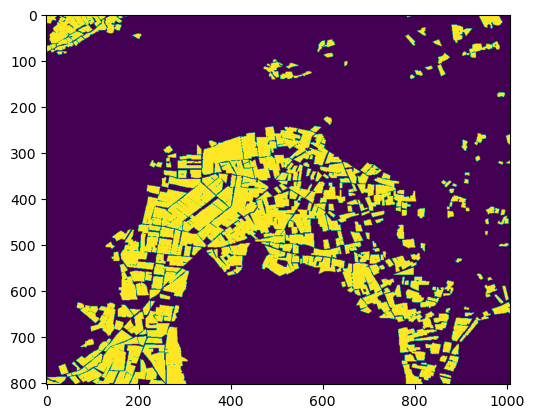

In [28]:
plt.imshow(label)

### compute_pq

In [29]:
import supervision as sv
# https://supervision.roboflow.com/detection/utils/

# ---------------------------------------
from shapely.geometry import Polygon
from shapely import unary_union, MultiPolygon # unary_union cascaded_union
import numpy as np

# https://github.com/Solafune-Inc/FieldAreaSegmentation/blob/main/pq_score_compute/pq_caluculate.py

def getIOU(polygon1: Polygon, polygon2: Polygon) -> float:
    intersection = polygon1.intersection(polygon2).area
    union = polygon1.union(polygon2).area
    if union == 0:
        return 0
    return intersection / union


def compute_pq(gt_polygons: list, pred_polygons: list, iou_threshold=0.5):
    matched_instances = {}
    gt_matched = np.zeros(len(gt_polygons))
    pred_matched = np.zeros(len(pred_polygons))

    gt_matched = np.zeros(len(gt_polygons))
    pred_matched = np.zeros(len(pred_polygons))
    for gt_idx, gt_polygon in enumerate(gt_polygons):
        best_iou = iou_threshold
        best_pred_idx = None
        for pred_idx, pred_polygon in enumerate(pred_polygons):
            if gt_matched[gt_idx] == 1 or pred_matched[pred_idx] == 1:
                continue
            
            iou = getIOU(gt_polygon, pred_polygon)
            if iou == 0:
                continue
            
            if iou > best_iou:
                best_iou = iou
                best_pred_idx = pred_idx
        if best_pred_idx is not None:
            matched_instances[(gt_idx, best_pred_idx)] = best_iou
            gt_matched[gt_idx] = 1
            pred_matched[best_pred_idx] = 1

    
    sq_sum = sum(matched_instances.values())
    num_matches = len(matched_instances)
    sq = sq_sum / num_matches if num_matches else 0
    rq = num_matches / (len(gt_polygons) + ((len(pred_polygons) - num_matches)/2.0)) if (gt_polygons or pred_polygons) else 0
    pq = sq * rq

    return pq, sq, rq

In [30]:
def polygons_to_mask(polygons: np.ndarray, shape) -> np.ndarray:
    mask = np.zeros(shape, dtype=np.uint8)
    cv2.fillPoly(mask, polygons, color=1)
    return mask

def get_pred_polygons(weighted_pred_th, buffer=0, area_th=5):
    
    pred_coords = sv.mask_to_polygons(weighted_pred_th)
    pred_polygons_ = [Polygon(c).buffer(buffer) for c in pred_coords]
    pred_polygons_ = [p for p in pred_polygons_ if p.area > area_th]
    pred_polygons = []
    for polygon in pred_polygons_:
        if polygon.geom_type == 'MultiPolygon':
            pred_polygons += list(polygon.geoms)
        else:
            pred_polygons += [polygon]
    
    pred_polygons_union = unary_union(pred_polygons)
    if pred_polygons_union.geom_type == 'MultiPolygon':
        pred_polygons = list(pred_polygons_union.geoms)
    
    return pred_polygons

pqs, sqs, rqs = [], [], []
weighted_pred_list = []
weighted_pred_list_p = []
true_count = []
pred_count = []

os.makedirs('valid', exist_ok=True)
for batch_i, (label, file) in enumerate(zip(CFG.valid_segmentation, CFG.valid_files)):
    
    # Get logit
    weighted_preds = []
    for mask_type_id, mask_type in enumerate(CFG.mask_types):
        preds = []
        for _ in range(len(cfgs)):
            preds.append(all_raw_preds_list[mask_type_id][_][batch_i].squeeze(dim=[0, 1]).detach().cpu().numpy())
        preds = np.stack(preds)
    
        # weighted_pred
        weighted_pred = np.average(preds, axis=0, weights=weights_list[mask_type_id])
        weighted_preds.append(weighted_pred)
    
    if len(weighted_preds) == 1:
        weighted_pred = weighted_preds[0]
        weighted_pred_th = np.where(weighted_pred > mask_threshold_list[0], 1, 0)
    else:
        weighted_pred = weighted_preds[0] * (1- weighted_preds[1])
        weighted_pred_th = np.where(weighted_pred > CFG.diff_threshold, 1, 0)
    
    # To polygons
    true_polygons = [Polygon(np.array(l).reshape(-1, 2)).buffer(0) for l in label]
    true_polygons = [p for p in true_polygons if p.area > 1]
    pred_polygons = get_pred_polygons(weighted_pred_th)
    
    true_count.append(len(true_polygons))
    pred_count.append(len(pred_polygons))
    
    # pq, sq, rq = compute_pq(true_polygons, pred_polygons)
    # print(f"{file} | pq:{pq:.4f}", f"sq:{sq:.4f}", f"rq:{rq:.4f}")
    # pqs.append(pq), sqs.append(sq), rqs.append(rq)
    
    # Save pred
    file_name = file.split("/")[-1].split(".")[0]
    np.savez(f'./valid/{file_name}', weighted_preds=weighted_preds)
    weighted_pred_list.append(weighted_pred)
    
    # Check P
    m = polygons_to_mask([np.array(p.exterior.coords).astype(int) for p in pred_polygons], weighted_pred.shape)
    weighted_pred_list_p.append(m)
    
print(f"Mean | pq:{np.mean(pqs):.4f}", f"sq:{np.mean(sqs):.4f}", f"rq:{np.mean(rqs):.4f}")

IndexError: list index out of range

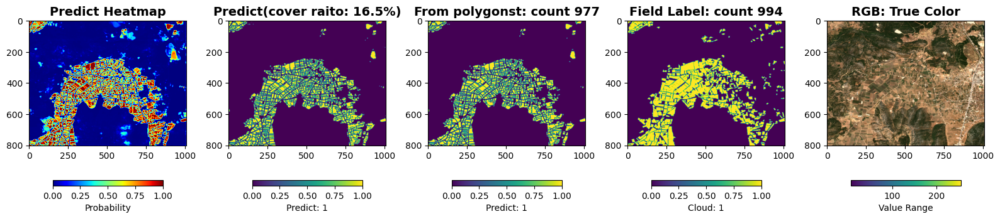

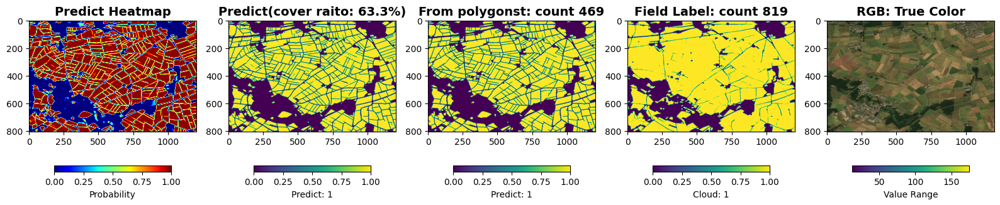

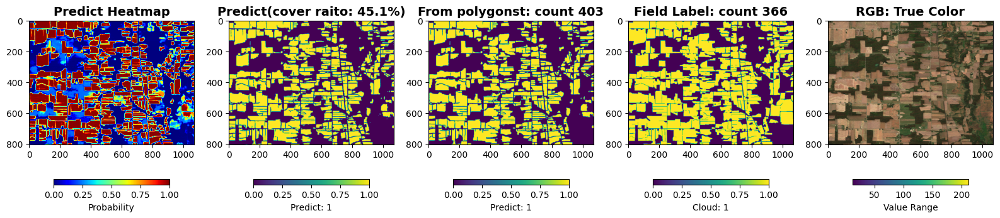

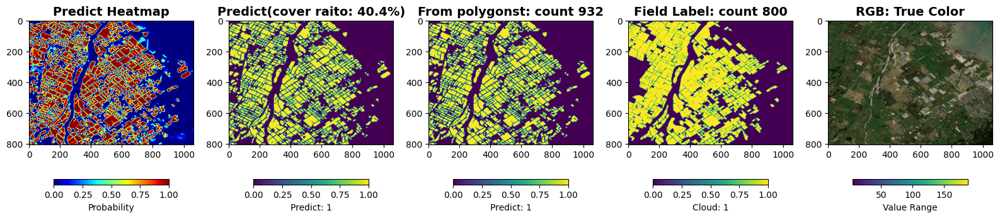

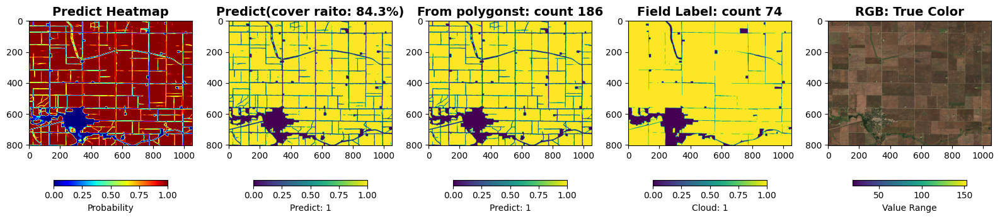

...

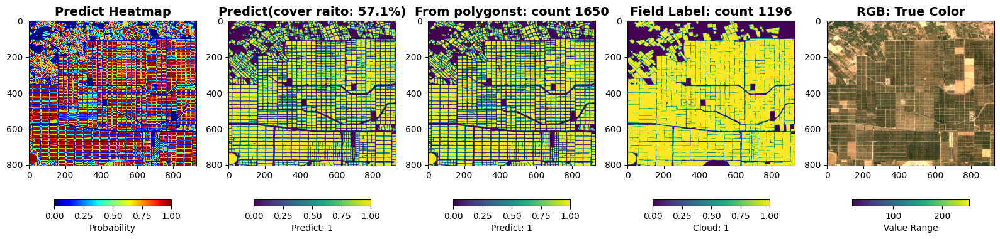

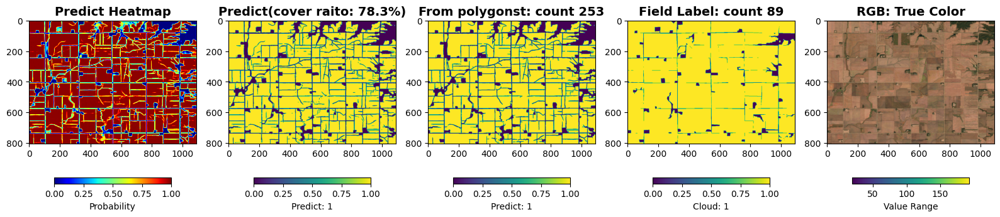

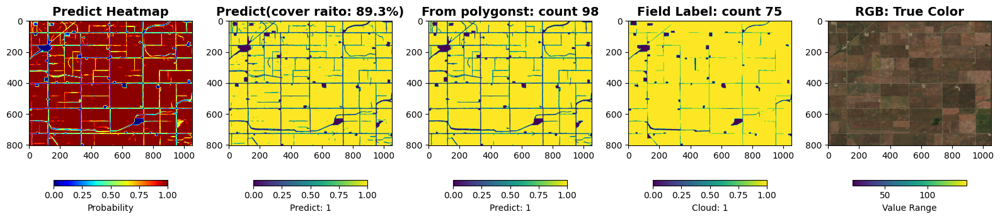

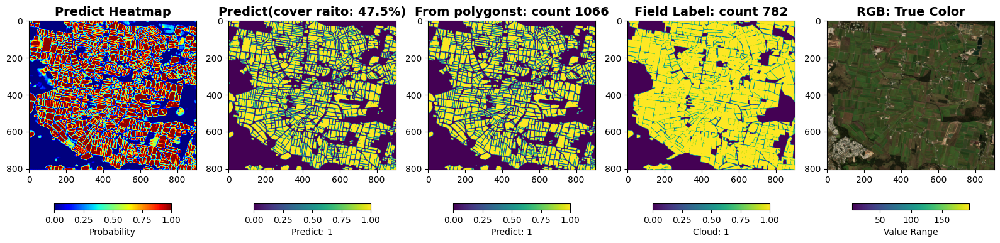

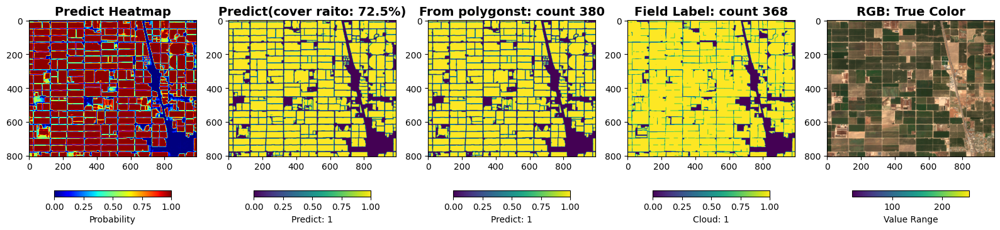

In [ ]:
val_dataset = FieldDataset(phase="valid", files=CFG.valid_files, transform=DataTransform(512, 512, 1), mask_type="mask")
val_dataloader = DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=num_workers)
for batch_i, (batch, file) in enumerate(zip(val_dataloader, CFG.valid_files)):

    _, label = batch
    label = label.squeeze(dim=0).detach().cpu().numpy()

    pred = weighted_pred_list[batch_i]
    label = label.astype(int)

    imgs = np.load(f'{CFG.data_root}/{file}')["image"]
    rgb = convert_rgb(imgs, (50, 2500))

    cover_raito = np.sum(pred > CFG.diff_threshold) / (pred.shape[0] * pred.shape[1]) * 100

    plt.figure(figsize=(16, 4))

    plt.subplot(1, 5, 1)
    plt.title(f'Predict Heatmap', fontsize=14, fontweight='bold')
    plt.imshow(pred, cmap='jet', vmin=0, vmax=1)
    plt.colorbar(shrink=0.7, label='Probability', orientation='horizontal')

    plt.subplot(1, 5, 2)
    plt.title(f'Predict(cover raito: {cover_raito:.1f}%)', fontsize=14, fontweight='bold')
    plt.imshow((pred > CFG.diff_threshold).astype(np.uint8), vmin=0, vmax=1)
    plt.colorbar(shrink=0.7, label='Predict: 1', orientation='horizontal')

    plt.subplot(1, 5, 3)
    plt.title(f'From polygonst: count {pred_count[batch_i]}', fontsize=14, fontweight='bold')
    plt.imshow(weighted_pred_list_p[batch_i].astype(np.uint8), vmin=0, vmax=1)
    plt.colorbar(shrink=0.7, label='Predict: 1', orientation='horizontal')
    
    plt.subplot(1, 5, 4)
    plt.title(f'Field Label: count {true_count[batch_i]}', fontsize=14, fontweight='bold')
    plt.imshow(label, vmin=0, vmax=1)
    plt.colorbar(shrink=0.7, label='Cloud: 1', orientation='horizontal')

    plt.subplot(1, 5, 5)
    plt.title(f'RGB: True Color', fontsize=14, fontweight='bold')        
    plt.imshow(rgb)
    plt.colorbar(shrink=0.7, label='Value Range', orientation='horizontal')

    plt.tight_layout()
    # plt.savefig(f"{PATH_OUTPUT}/predict_{_id}_nir.png")
    plt.show();

### Test

In [ ]:
all_raw_preds_list = []
for mask_type_id, mask_type in enumerate(CFG.mask_types):
    all_raw_preds = []
    for i, cfg in enumerate(cfgs):
        print(f'--{i}--', cfg['model']['encoder'], '-'*10)
        encoder_name = cfg['model']['encoder']

        with open(f'training_fold-{CFG.select_fold}/config.yaml','r') as f:
            config = yaml.safe_load(f)
        config['model']['slide']['h_crop'] = cfg['model']['height']
        config['model']['slide']['w_crop'] = cfg['model']['width']
        config['model']['tta'] = False
        
        if mask_type == "mask":
            pass
        else:
            config['model']['slide']['image_div'] = 2
        
        test_dataset = FieldDataset(
            phase="test", files=CFG.test_files, 
            transform=DataTransform(cfg['model']['height'], cfg['model']['width'], config['model']['slide']['image_div']), 
            mask_type="mask"
        )
        test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=num_workers)

        with open(f'training_fold-{CFG.select_fold}/config.yaml','r') as f:
            config = yaml.safe_load(f)
        config['model']['slide']['h_crop'] = cfg['model']['height']
        config['model']['slide']['w_crop'] = cfg['model']['width']
        config['model']['tta'] = False
        
        model = Model(cfg=cfg, mask_type=mask_type)
        model_module = LightningModule(model, config)

        test_predict = trainer.predict(model_module, dataloaders=test_dataloader,
                                ckpt_path=f'training_fold-{CFG.select_fold}/models/' + model_names[mask_type][i] + '.ckpt')

        raw_preds = [_[0] for _ in test_predict]
        all_raw_preds.append(raw_preds)
        
    all_raw_preds_list.append(all_raw_preds)

--0-- tu-resnest26d ----------


Restoring states from the checkpoint path at ./models/model00-mask-field-epoch=86-val_loss=0.190-val_dice=0.839.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
Loaded model weights from the checkpoint at ./models/model00-mask-field-epoch=86-val_loss=0.190-val_dice=0.839.ckpt


Predicting DataLoader 0: 100%|██████████| 50/50 [00:12<00:00,  3.96it/s]
--1-- tu-maxvit_small_tf_512 ----------


Restoring states from the checkpoint path at ./models/model01-mask-field-epoch=61-val_loss=0.183-val_dice=0.842.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
Loaded model weights from the checkpoint at ./models/model01-mask-field-epoch=61-val_loss=0.183-val_dice=0.842.ckpt


Predicting DataLoader 0: 100%|██████████| 50/50 [00:36<00:00,  1.35it/s]
--2-- tu-maxxvitv2_rmlp_base_rw_384 ----------


Restoring states from the checkpoint path at ./models/model02-mask-field-epoch=41-val_loss=0.220-val_dice=0.832.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
Loaded model weights from the checkpoint at ./models/model02-mask-field-epoch=41-val_loss=0.220-val_dice=0.832.ckpt


Predicting DataLoader 0: 100%|██████████| 50/50 [00:51<00:00,  0.97it/s]
--0-- tu-resnest26d ----------


Restoring states from the checkpoint path at ./models/model00-mask_bound-field-epoch=64-val_loss=0.759-val_dice=0.255.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
Loaded model weights from the checkpoint at ./models/model00-mask_bound-field-epoch=64-val_loss=0.759-val_dice=0.255.ckpt


Predicting DataLoader 0: 100%|██████████| 50/50 [00:12<00:00,  4.16it/s]
--1-- tu-maxvit_small_tf_512 ----------


Restoring states from the checkpoint path at ./models/model01-mask_bound-field-epoch=67-val_loss=0.755-val_dice=0.256.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
Loaded model weights from the checkpoint at ./models/model01-mask_bound-field-epoch=67-val_loss=0.755-val_dice=0.256.ckpt


Predicting DataLoader 0: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]
--2-- tu-maxxvitv2_rmlp_base_rw_384 ----------


Restoring states from the checkpoint path at ./models/model02-mask_bound-field-epoch=77-val_loss=0.752-val_dice=0.264.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1]
Loaded model weights from the checkpoint at ./models/model02-mask_bound-field-epoch=77-val_loss=0.752-val_dice=0.264.ckpt


Predicting DataLoader 0: 100%|██████████| 50/50 [00:52<00:00,  0.95it/s]


In [31]:
with open("data/sample.json", "r") as file:
    submit = json.load(file)

os.makedirs('test', exist_ok=True)
test_preds = []
for batch_i, file in enumerate(CFG.test_files):
    
    # Get logit
    weighted_preds = []
    for mask_type_id, mask_type in enumerate(CFG.mask_types):
        preds = []
        for _ in range(len(cfgs)):
            preds.append(all_raw_preds_list[mask_type_id][_][batch_i].squeeze(dim=[0, 1]).detach().cpu().numpy())
        preds = np.stack(preds)
    
        # weighted_pred
        weighted_pred = np.average(preds, axis=0, weights=weights_list[mask_type_id])
        weighted_preds.append(weighted_pred)
    
    if len(weighted_preds) == 1:
        weighted_pred = weighted_preds[0]
        weighted_pred_th = np.where(weighted_pred > mask_threshold_list[0], 1, 0)
    else:
        weighted_pred = weighted_preds[0] * (1- weighted_preds[1])
        weighted_pred_th = np.where(weighted_pred > CFG.diff_threshold, 1, 0)
        
    test_preds.append(weighted_pred)
    
    # To polygons
    pred_polygons = get_pred_polygons(weighted_pred_th)
    # pred_coords = sv.mask_to_polygons(weighted_pred_th)
    # pred_polygons = [Polygon(c).buffer(0) for c in pred_coords]
    # pred_polygons = [p for p in pred_polygons if p.area > 1]
    annotations = []
    for polygon in pred_polygons:
        if polygon.geom_type == 'MultiPolygon':
            for p in polygon.geoms:
                segmentation = np.array(p.exterior.coords).ravel().tolist()
                annotation = {'class': 'field', 'segmentation': segmentation}
                annotations.append(annotation)
        else:
            segmentation = np.array(polygon.exterior.coords).ravel().tolist()
            annotation = {'class': 'field', 'segmentation': segmentation}
            annotations.append(annotation)
    submit['images'][batch_i]['annotations'] = annotations
    
    # Save pred
    file_name = file.split("/")[-1].split(".")[0]
    np.savez(f'./test/{file_name}', weighted_pred=weighted_pred)
    
# Save Submit
output_file_path = f"submit_fold{CFG.select_fold}.json"
with open(output_file_path, "w", encoding="utf-8") as output_file:
    json.dump(submit, output_file, ensure_ascii=True, indent=4)

FileNotFoundError: [Errno 2] No such file or directory: 'data/sample.json'

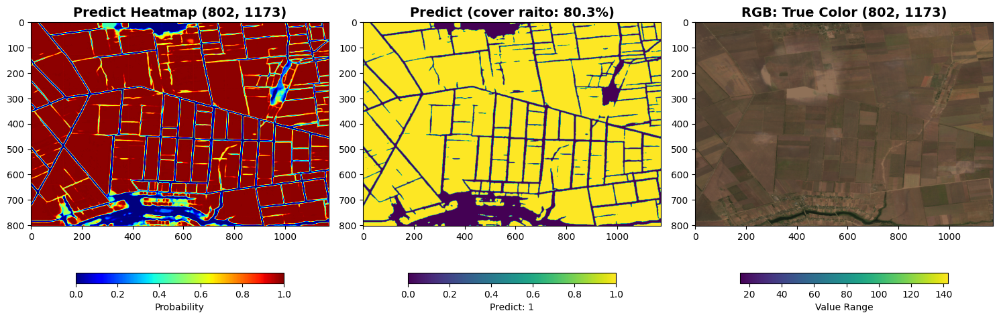

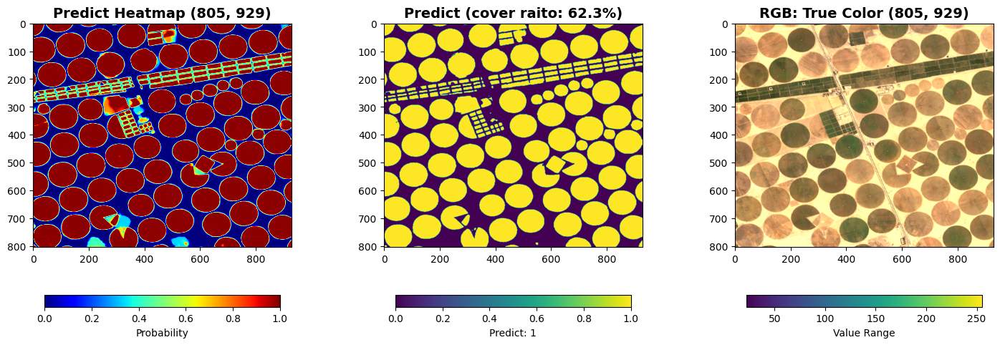

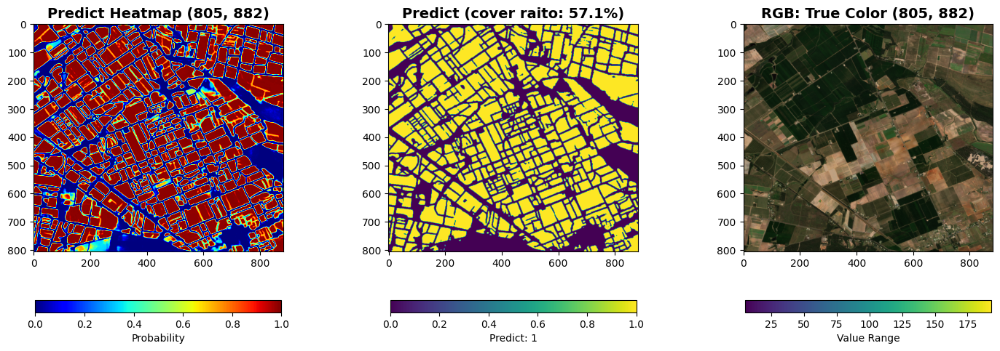

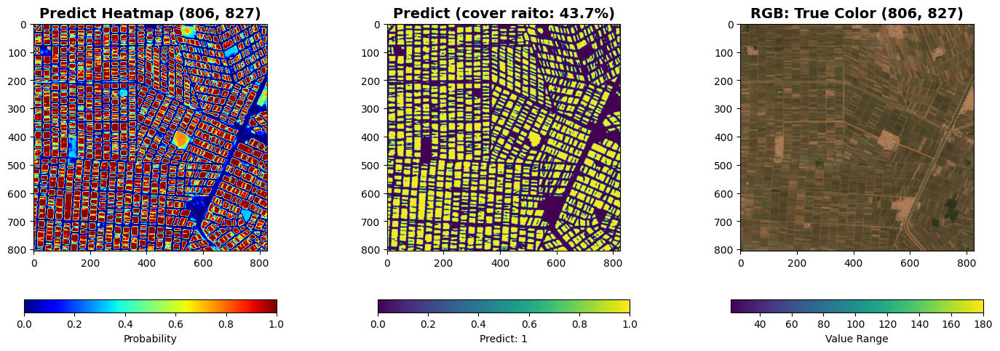

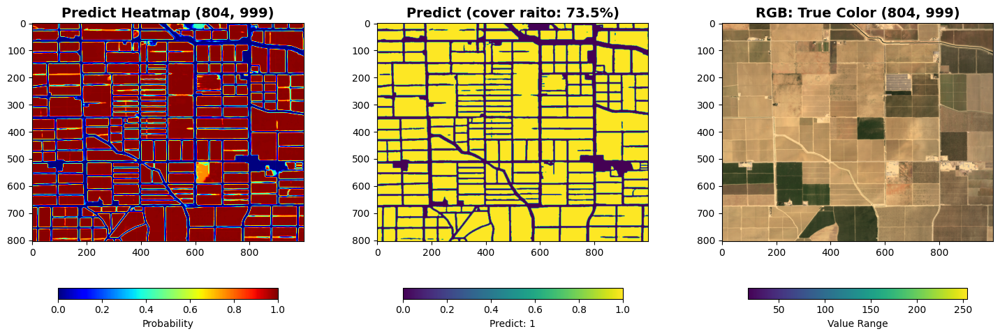

...

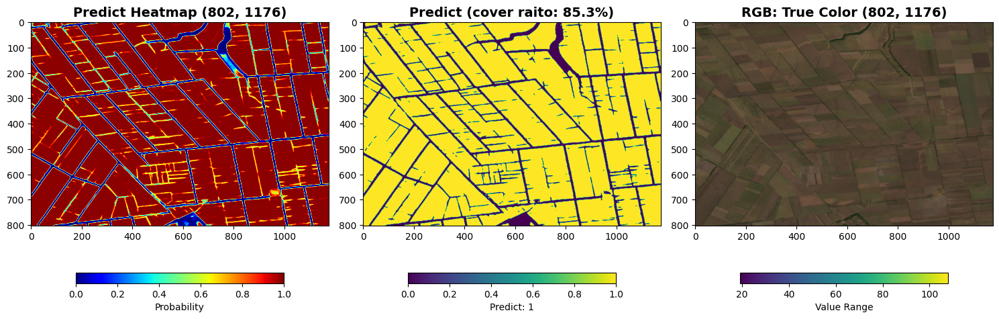

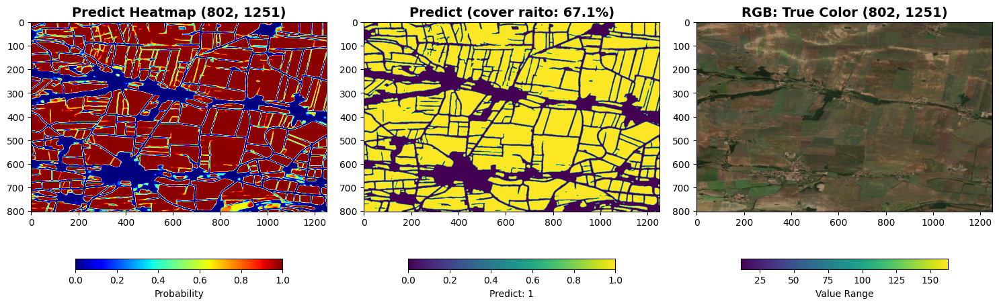

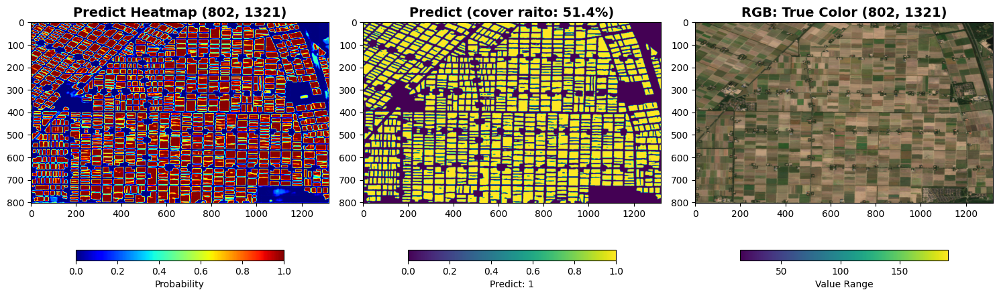

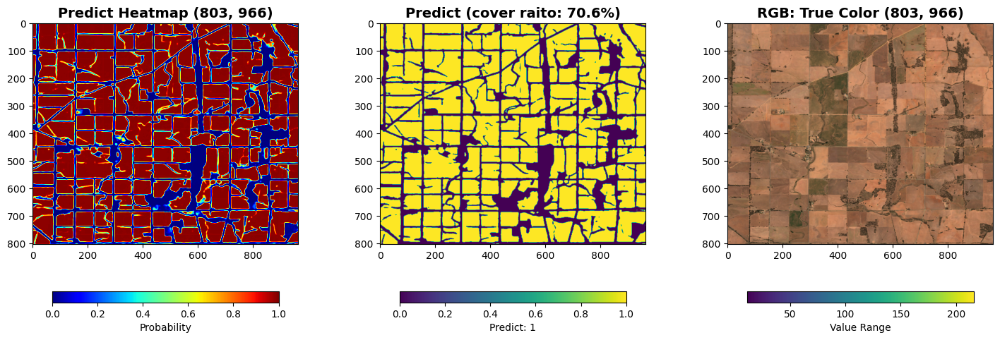

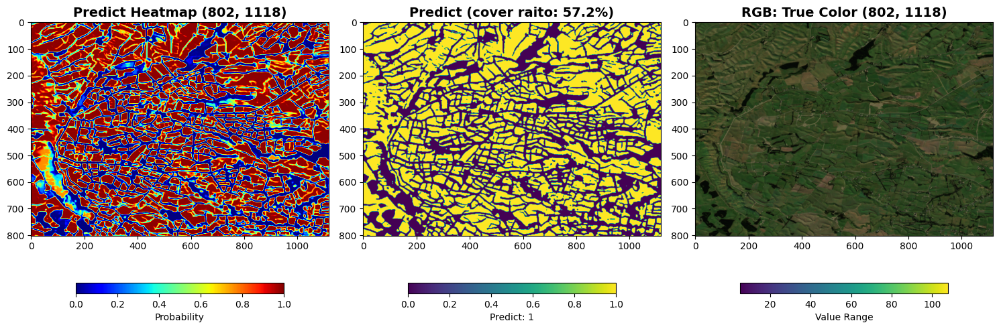

In [ ]:
for batch_i, (pred, file) in enumerate(zip(test_preds, CFG.test_files)):
    
    imgs = np.load(f'{CFG.data_root}/{file}')["image"]
    rgb = convert_rgb(imgs, (50, 2500))
    
    cover_raito = np.sum(pred > CFG.diff_threshold) / (pred.shape[0] * pred.shape[1]) * 100

    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.title(f'Predict Heatmap {pred.shape[:2]}', fontsize=14, fontweight='bold')
    plt.imshow(pred, cmap='jet', vmin=0, vmax=1)
    plt.colorbar(shrink=0.7, label='Probability', orientation='horizontal')

    plt.subplot(1, 3, 2)
    plt.title(f'Predict (cover raito: {cover_raito:.1f}%)', fontsize=14, fontweight='bold')
    plt.imshow((pred > CFG.diff_threshold).astype(np.uint8), vmin=0, vmax=1)
    plt.colorbar(shrink=0.7, label='Predict: 1', orientation='horizontal')
    
    plt.subplot(1, 3, 3)
    plt.title(f'RGB: True Color {imgs.shape[:2]}', fontsize=14, fontweight='bold')        
    plt.imshow(rgb)
    plt.colorbar(shrink=0.7, label='Value Range', orientation='horizontal')

    plt.tight_layout()
    # plt.savefig(f"{PATH_OUTPUT}/predict_{_id}_nir.png")
    plt.show();
    
    if batch_i == 10:
        break

In [32]:
# %cd /kaggle/working
# !rm -r ./FieldAreaSegmentation
# !rm -r ./lightning_logs